# Use of RFID technology to characterize feeder visitations and contact network of hummingbirds in urban habitats. 

### Ruta R. Bandivadekar, Pranav S. Pandit, Rahel Sollmann, Michael J. Thomas, Scott Logan, Jennifer Brown, A.P. Klimley, and Lisa A. Tell

The notebook demonstrates analysis presented in the manuscript 

We developed a Python package *'taggit'* for reading the tag detection data collapsing it into visits and visualization of PIT tagged hummigbird activity at the novel feeding stations.  

In [1]:
## setting up local path and importing python packages
data_path = 'C:/Users/Falco/Desktop/directory/taggit/BH_analysis/'
path = 'C:/Users/Falco/Desktop/directory/taggit'
output_path = 'C:/Users/Falco/Desktop/directory/taggit/BH_analysis/outputs/'

## importing python packages
import os as os
import pandas as pd
%matplotlib inline 
from bokeh.io import show, output_file , output_notebook, save
output_notebook()
from bokeh.models import Plot, Range1d, MultiLine, Circle, HoverTool, TapTool, BoxSelectTool, BoxZoomTool, ResetTool, PanTool, WheelZoomTool, graphs
from bokeh.palettes import Spectral4
from matplotlib import pyplot as plt
os.chdir(path)
from scipy import stats 
import numpy as np
from scipy import stats
import joypy
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from matplotlib import cm

# Importing the taggit package
from taggit import functions as HT
from taggit import interactions as Hxnet

import matplotlib.style as style
style.use('fivethirtyeight')
plt.rcParams['lines.linewidth'] = 1
dpi = 1000

Loading BokehJS ...

Loading BokehJS ...

## importing data
function: ** read_tag_files**

this function will 

    1.read all text files from a folder (just keep tag files in this folder no other txt files)
    2.remove unwanted tag reads: fishtags, other removes which were some mistakes done during installing readers
    3.ability to restrict analysis to to specific location/readers this function will filter the data accordingly
    4.for the current analysis presented in the paper we are not inlcuding rufous humminbirds

In [2]:
tag_data = HT.read_tag_files(data_path = data_path, select_readers = ['A9', 'B1', 'B2', "B3", "B5", "B6"], 
                            remove_rufous= True)

Beacuse of battery and power problems A4 reader was not function for some time. We use data from A2 reader which for a top reader from the DAFS for that duration 

see first 5 lines in the dataframe

In [3]:
tag_data.head()

,Date,Time,Reader,Tag,ID,DateTime
DateTime,,,,,,
2018-10-11 09:07:00,2018-10-11,09:07:00,A9,TAG,3D6.1D593D77F1,2018-10-11 09:07:00
2018-10-11 09:08:34,2018-10-11,09:08:34,A9,TAG,3D6.1D593D77F1,2018-10-11 09:08:34
2018-10-11 09:25:31,2018-10-11,09:25:31,A9,TAG,3D6.1D593D786D,2018-10-11 09:25:31
2018-10-11 09:26:57,2018-10-11,09:26:57,A9,TAG,3D6.1D593D786D,2018-10-11 09:26:57
2018-10-11 09:28:21,2018-10-11,09:28:21,A9,TAG,3D6.1D593D45F1,2018-10-11 09:28:21


In [4]:
tag_data.DateTime.max()

Timestamp('2019-01-04 15:13:51')

In [5]:
print ('number of tag reads during study period= '+str(tag_data.shape[0]))

number of tag reads during study period= 133668


in the manuscript we are analysing data only until March 2018

In [6]:
#tag_data = tag_data.ix[:'2018-03-31']

### list of bird ids visiting the feeder

In [7]:
tag_data.ID.unique()

array(['3D6.1D593D77F1', '3D6.1D593D786D', '3D6.1D593D45F1',
       '3D6.1D593D77BD', '3D6.001881F784', '3D6.1D593D7881',
       '3D6.1D593D7850', '3D6.1D593D7816', '3D6.1D593D77F9',
       '3D6.1D593D45DB', '3D6.1D593D7815', '3D6.1D593D7845',
       '3D6.1D593D783C', '3D6.1D593D7806', '3D6.1D593D77D4',
       '3D6.1D593D7840', '3D6.1D593D77C7', '3D6.1D593D77C3',
       '3D6.1D593D7810', '3D6.1D593D7855', '3D6.1D593D77CA',
       '3D6.1D593D7864', '3D6.1D593E1958', '3D6.1D593E19A4',
       '3D6.1D593D77D6', '3D6.1D593D77F0', '3D6.1D593D77BF',
       '3D6.1D593D7805', '3D6.1D593D7807', '3D6.1D593D780F',
       '3D6.1D593D784C', '3D6.1D593D787C', '3D6.1D593D45B2',
       '3D6.1D593D7820', '3D6.1D593D77F3', '3D6.1D593D781C',
       '3D6.001881F780', '3D6.1D593D77CB', '3D6.1D593D7866',
       '3D6.1D593D4611', '3D6.1D593D77EC', '3D6.1D593D77F7',
       '3D6.1D593D77D0', '3D6.1D593D7804', '3D6.1D593E19B1',
       '3D6.1D593D7834', '3D6.1D593D77FB', '3D6.1D593E1987',
       '3D6.1D593D784E',

In [8]:
len(tag_data.ID.unique())

320

**even though we have 155 birds detected in the data, we restrict our analysis to birds that have been tagged until end February 2018** 

### collapse_reads_10_seconds

this function will

    1. for each individual bird, it will calculate different between each reads
    2. if the difference is more that 0.11 seconds it will identify it as a new visit.
    3. for each new visit, it will identify the starting time, ending time
    

In [9]:
visit_data = HT.collapse_reads_10_seconds(data= tag_data)

In [10]:
visit_data.head()

,visit_start,visit_end,ID,Tag,visit_duration
0,2018-04-15 13:16:20,2018-04-15 13:16:20,3D6.00184967F0,B2,00:00:00
1,2018-12-09 08:32:07,2018-12-09 08:32:07,3D6.00184967F0,B5,00:00:00
2,2018-10-21 11:45:26,2018-10-21 11:45:26,3D6.00184967F0,B6,00:00:00
3,2018-12-14 14:22:49,2018-12-14 14:22:50,3D6.00184967F0,B5,00:00:01
4,2018-10-30 07:36:45,2018-10-30 07:36:45,3D6.00184967F0,B6,00:00:00


In [11]:
#visit_data.to_csv(output_path +'\Collapsed_visits.csv')
#visit_data.to_csv(team_path +'\Collapsed_visits.csv')

number of visits recorded

In [12]:
print ('number of visits recorded during study period= '+str(visit_data.shape[0]))

number of visits recorded during study period= 91055


### read metadata file

this function will

    1. read the master metadata file for all the birds PIT tagged until now
    2. filter the data according to the study location 

In [13]:
meta = HT.read_metadata(data_path = data_path , filename = 'RFIDExport-2019-01-22-202025.xlsx', 
                       restrict = False)
meta = meta.drop_duplicates('Tag Hex', keep= 'first')
meta['Location Id'].unique()
## removing data for birds tagged in another site not in this study
remove_glide = list(set(meta[meta['Location Id'] == 'GR']['Tag Hex'].unique().tolist()).difference(set(visit_data.ID.unique().tolist())))
meta = meta[~meta['Tag Hex'].isin(remove_glide)]
meta.Species.unique()
meta.shape

(378, 10)

In [14]:
meta.Species.unique()

array([u'ANHU', u'ALHU', u'-', u'RUHU', u'BCHU'], dtype=object)

In [15]:
meta.head()

,SrNo.,Tag Hex,Tag Dec,Species,Age,Sex,Tagged Date,Location,Location Id,ShortBandLetterNumber
0,13837,3D6.1D593D45D8,982.126051,ANHU,UNK,M,2017-10-15,BH,SB,K89408
1,13838,3D6.1D593D45B7,982.126051,ANHU,HY,M,2017-10-15,BH,SB,K89407
2,13846,3D6.001881F771,982.000411,ANHU,HY,M,2017-10-15,BH,SB,K89405
3,13847,3D6.1D593D45B5,982.126051,ANHU,UNK,M,2017-10-15,BH,SB,K89409
4,13848,3D6.001881F777,982.000411,ANHU,UNK,M,2017-10-15,BH,SB,K89410


### merge TAG data and Metadata

this function will
    1. merge the tag read data with the metadata using the 'Tag Hex' column
    2. Merge the data only after running **collapse_reads_10_seconds** function 
    3. identifies birds which were tagged and found on the same day in 2016

In [16]:
data = HT.merge_metadata(data = visit_data, metadata = meta, for_paper = False)

**even though we have 155 birds detected in the data, we restrict our analysis to birds that have been tagged until end February 2018** 

In [17]:
a = meta['Tag Hex'].unique().tolist()
data = data[data['ID'].isin(a)]

In [18]:
meta.Location.unique()

array([u'BH'], dtype=object)

In [19]:
data['Location'].value_counts()

BH    86533
Name: Location, dtype: int64

In [20]:
data.Species.unique()

array([u'ANHU', u'ALHU', u'BCHU', u'RUHU'], dtype=object)

In [21]:
data.Species.value_counts(normalize=True)

ANHU    0.670819
ALHU    0.325598
BCHU    0.001837
RUHU    0.001745
Name: Species, dtype: float64

In [22]:
Bird_summary, reader_predilection = HT.bird_summaries(data = data,
                                 output_path = output_path,
                                 metadata = meta)

In [23]:
Bird_summary[['obser_period', 'first_obs_aft_tag', 'date_u']].describe()

,obser_period,first_obs_aft_tag,date_u
count,293,293,293.000000
mean,113 days 23:45:15.358361,26 days 23:50:10.238907,30.470990
std,123 days 02:37:06.988038,56 days 02:30:21.494658,38.276437
min,0 days 00:00:00,0 days 00:00:00,1.000000
25%,30 days 00:00:00,1 days 00:00:00,5.000000
50%,51 days 00:00:00,5 days 00:00:00,18.000000
75%,185 days 00:00:00,26 days 00:00:00,36.000000
max,446 days 00:00:00,362 days 00:00:00,216.000000


In [24]:
data.groupby('Tag').ID.nunique()

Tag
A9    143
B1     72
B2    186
B5    115
B6    193
Name: ID, dtype: int64

# Table 1 

In [25]:
pd.pivot_table(meta, index = 'Species', columns=['Sex', 'Age'], values='Tag Hex', aggfunc='count', margins= True, fill_value=0)

Sex       F          M          All
Age     AHY HY UNK AHY  HY UNK     
Species                            
-         0  0   0   1   0   0    1
ALHU     30  1  40  40  28  33  172
ANHU     33  5  43  46  35  34  196
BCHU      2  0   0   0   1   0    3
RUHU      5  0   0   1   0   0    6
All      70  6  83  88  64  67  378

In [26]:
pd.pivot_table(meta, index = 'Species', columns='Age', values='Tag Hex', aggfunc='count', margins= True, fill_value=0)

Age,AHY,HY,UNK,All
Species,,,,
-,1,0,0,1
ALHU,70,29,73,172
ANHU,79,40,77,196
BCHU,2,1,0,3
RUHU,6,0,0,6
All,158,70,150,378


In [27]:
table1 = HT.report_Table1A(metadata = meta, location= ['SB', 'Arbo -1 ','BH', 'GR'])
table1.to_csv(output_path+'/table1.csv')
table1

Species,-,Allen's Hummingbird,Anna's Hummingbird,BCHU,Rufous Hummingbird,All
Sex,,,,,,
female,0,71,81,2,5,159
male,1,101,115,1,1,219
All,1,172,196,3,6,378


# Table 2

In [28]:
table2 = HT.report_Table2Paper(metadata = meta, location= ['SB', 'Arbo -1 ','BH', 'GR'] )
table2.to_csv(output_path+'/table2.csv')
table2

Species,-,Allen's Hummingbird,Anna's Hummingbird,BCHU,Rufous Hummingbird,All
Location Id,,,,,,
SB,1,172,196,3,6,378
All,1,172,196,3,6,378


# Table 4

In [29]:
table4 = HT.paper_Table2(data = data, metadata = meta, location= ['SB', 'Arbo -1 ','BH', 'GR'])
table4.to_csv(output_path+'/table4.csv')
table4

Sex                           female                                male  \
Age                 after hatch year hatch year unknown after hatch year   
Species                                                                    
Allen's Hummingbird               27          0      38               30   
Anna's Hummingbird                26          4      31               37   
BCHU                               2          0       0                0   
Rufous Hummingbird                 0          0       0                1   
All                               55          4      69               68   

Sex                                     All  
Age                 hatch year unknown       
Species                                      
Allen's Hummingbird         21      24  140  
Anna's Hummingbird          22      29  149  
BCHU                         1       0    3  
Rufous Hummingbird           0       0    1  
All                         44      53  293

In [30]:
pd.pivot_table(data, columns='Sex', index='Species', aggfunc='nunique', values='ID')

Sex,F,M
Species,,
ALHU,65.0,75.0
ANHU,61.0,88.0
BCHU,2.0,1.0
RUHU,NaN,1.0


In [31]:
pd.pivot_table(data, columns='Age', index='Species', aggfunc='nunique', values='ID')

Age,AHY,HY,UNK
Species,,,
ALHU,57.0,21.0,62.0
ANHU,63.0,26.0,60.0
BCHU,2.0,1.0,NaN
RUHU,1.0,NaN,NaN


# Figure 5: 

### Daily visitations of PIT- tagged male and female Anna’s Hummingbirds at the feeding stations at Sites 1 and 2 in Northern California and Site 3 in Southern California from September 2016 to March 2018. 

C:\Users\Falco\Anaconda2\lib\site-packages\ipykernel_launcher.py:54: FutureWarning: 
.resample() is now a deferred operation
You called cumsum(...) on this deferred object which materialized it into a series
by implicitly taking the mean.  Use .resample(...).mean() instead
C:\Users\Falco\Anaconda2\lib\site-packages\matplotlib\figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


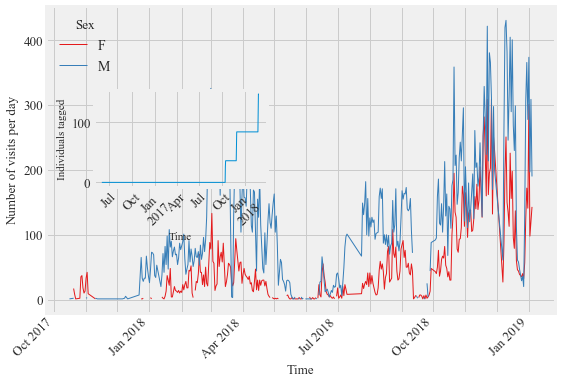

In [32]:
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
data.Sex.fillna('unknown', inplace= True)
alhu_data = data[data.Species == "ALHU"]
anhu_data = data[data.Species == "ANHU"]
plt.rcParams['font.size'] = 13
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = plt.rcParams['font.size']
plt.rcParams['axes.titlesize'] = 1.5*plt.rcParams['font.size']
plt.rcParams['legend.fontsize'] = plt.rcParams['font.size']+1
plt.rcParams['xtick.labelsize'] = plt.rcParams['font.size']
plt.rcParams['ytick.labelsize'] = plt.rcParams['font.size']

def plotvisits(timeunit, data, ax, c = ['#e41a1c', '#377eb8', '#4daf4a'], style = '-'):
    """timeunite: 10Min, D =  day, W = week, M = month"""
    if timeunit == '10Min':
        t = '10 minutes'
    elif timeunit == 'D':
        t = 'day'
    elif timeunit == 'W':
        t = 'week'
    if timeunit == 'M':
        t = 'month'
    a = data.groupby([ pd.Grouper(freq=timeunit), 'Sex'])['ID'].count().unstack('Sex')
    a.plot(kind="line", style = style, rot =45, ax= ax,stacked=False, color = c,)
    
    #set ticks every month
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    #set major ticks format
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    
    ## hiding every second month
    for index, label in enumerate(ax.xaxis.get_ticklabels()):
        if index % 3 != 0:
            label.set_visible(False)
    
    #ax.set_title('visits per '+t)
    ax.set_xlabel('Time')
    ax.set_ylabel('Number of visits per day')

f, (ax1)  = plt.subplots(1, 1, figsize=(8,6))
plotvisits(timeunit= 'D', data = anhu_data, ax= ax1)


# These are in unitless percentages of the figure size. (0,0 is bottom left)
left, bottom, width, height = [0.175, 0.5, 0.3, 0.225]
ax2 = f.add_axes([left, bottom, width, height])

import matplotlib.dates as mdates
idx = pd.date_range('06.01.2016', '02.28.2018')
a = meta.groupby('Tagged Date')['Tag Hex'].nunique()
a.index = pd.DatetimeIndex(a.index)
a = a.reindex(idx, fill_value=0)
a.resample('D').cumsum().plot(kind="line", rot =45,ax = ax2)

ax2.set_ylabel('Individuals tagged', fontsize = 11)
ax2.set_xlabel('Time', fontsize = 11)



f.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(output_path + '\Figure4.png', dpi = dpi)
plt.savefig(output_path + '\Figure4.eps',format = 'eps', dpi = dpi)
plt.show()

In [33]:
[item.get_text() for item in ax1.get_xticklabels()]

[u'Oct 2017',
 u'Nov 2017',
 u'Dec 2017',
 u'Jan 2018',
 u'Feb 2018',
 u'Mar 2018',
 u'Apr 2018',
 u'May 2018',
 u'Jun 2018',
 u'Jul 2018',
 u'Aug 2018',
 u'Sep 2018',
 u'Oct 2018',
 u'Nov 2018',
 u'Dec 2018',
 u'Jan 2019']

In [34]:
anhu_data.index

DatetimeIndex(['2018-04-15 13:16:20', '2018-12-09 08:32:07',
               '2018-10-21 11:45:26', '2018-12-14 14:22:49',
               '2018-10-30 07:36:45', '2018-12-16 08:29:43',
               '2018-10-30 10:52:52', '2018-12-16 08:50:39',
               '2018-10-30 11:42:49', '2018-12-16 11:41:04',
               ...
               '2018-12-09 15:10:26', '2018-12-09 15:31:35',
               '2018-12-10 09:20:39', '2018-12-10 11:25:19',
               '2018-12-10 12:20:49', '2018-12-10 15:34:32',
               '2018-12-11 15:58:35', '2018-12-12 10:44:27',
               '2018-12-12 14:16:38', '2018-11-19 06:43:58'],
              dtype='datetime64[ns]', name=u'visit_start', length=58048, freq=None)

In [35]:
data.shape

(86533, 17)

### Tagging activity Figure 5 Inset: The cumulative tagging effort throughout the study.

C:\Users\Falco\Anaconda2\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: 
.resample() is now a deferred operation
You called cumsum(...) on this deferred object which materialized it into a series
by implicitly taking the mean.  Use .resample(...).mean() instead
  # Remove the CWD from sys.path while we load stuff.


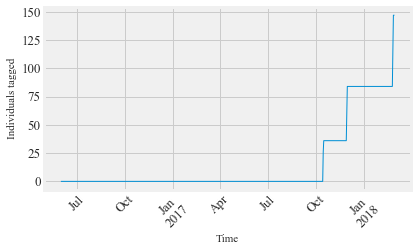

In [36]:
import matplotlib.dates as mdates
fig, ax1 = plt.subplots(1, figsize=(6,4))
idx = pd.date_range('06.01.2016', '02.28.2018')
a = meta.groupby('Tagged Date')['Tag Hex'].nunique()
a.index = pd.DatetimeIndex(a.index)
a = a.reindex(idx, fill_value=0)
#tl = a.cumsum()
#tl.columns = ['sampling']
#tl.plot.line(drawstyle = 'steps', label='Animals', rot =45,ax = ax1)
a.resample('D').cumsum().plot(kind="line", rot =45,ax = ax1)
#set ticks every month
#ax1.xaxis.set_major_locator(mdates.MonthLocator())
#set major ticks format
#ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

## hiding every second month
#for index, label in enumerate(ax1.xaxis.get_ticklabels()):
#    if index % 3 != 0:
#        label.set_visible(False)

ax1.set_ylabel('Individuals tagged', fontsize = 11)
ax1.set_xlabel('Time', fontsize = 11)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(output_path+'/'+'cumulative_tagging.png', dpi = dpi)
plt.savefig(output_path+'/'+'cumulative_tagging.eps',format = 'eps',  dpi = dpi)
plt.show()

# Figure 6:

### Comparison of the daily detections from the two different antennas at the double antenna feeding station  transceiver at Site 2 over time. The top antenna for this feeding station was deployed in May 2017 and discontinued in January 2018 for data collection. Overall, the total number of visits detected by the side antenna exceeded the number of visits for the top antenna but not enough to warrant the addition of a second antenna. Both antennas detected the presence of the same number of individual birds.

## Top reader
tag_dataA2 = HT.read_tag_files(data_path = data_path, select_readers = ['A2'], )
visit_dataA2 = HT.collapse_reads_10_seconds(data= tag_dataA2)
dataA2 = HT.merge_metadata(data = visit_dataA2, metadata = meta, for_paper = True)

## Side reader
tag_dataA4 = HT.read_tag_files(data_path = data_path, select_readers = ['A4'])
visit_dataA4 = HT.collapse_reads_10_seconds(data= tag_dataA4)
dataA4 = HT.merge_metadata(data = visit_dataA4, metadata = meta, for_paper = True)

dataA4 = dataA4.ix['2017-05-23':'2018-01-25']
dataA2 = dataA2.ix['2017-05-23':'2018-01-25']

print ('side antenna recorded ' +str(dataA4.shape[0]) + ' visits')

print ('top antenna recorded ' +str(dataA2.shape[0]) + ' visits')

print ('side antenna recorded ' +str(len(dataA4.ID.unique())) + ' PIT tagged birds')

print ('top antenna recorded ' +str(len(dataA2.ID.unique())) + ' PIT tagged birds')

# Figure 6

In [37]:
dpi = 1000

def plotvisits(timeunit, data, ax, c = ['#e41a1c', '#377eb8', '#4daf4a']):
           
        """timeunite: 10Min, D =  day, W = week, M = month"""
        if timeunit == '10Min':
            t = '10 minutes'
        elif timeunit == 'D':
            t = 'day'
        elif timeunit == 'W':
            t = 'week'
        if timeunit == 'M':
            t = 'month'
        data.groupby([ pd.Grouper(freq=timeunit)])['ID'].count().plot(kind="line", rot =45, ax= ax)
        
        #set ticks every month
        #ax.xaxis.set_major_locator(mdates.MonthLocator())
        #set major ticks format
        #ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y %B'))

        ## hiding every second month
        #for index, label in enumerate(ax.xaxis.get_ticklabels()):
        #    if index % 3 != 0:
        #        label.set_visible(False)

        #ax.set_title('visits per '+t)
        ax.set_xlabel('Time')
        ax.set_ylabel('Number of visits per day')

                
f, (ax1)  = plt.subplots(1, 1, figsize=(8,6))
plotvisits(timeunit= 'D', data= dataA4, ax= ax1)
plotvisits(timeunit= 'D', data= dataA2, ax= ax1)
labels = ['Jun 2017', 'Jul 2017', 'Aug 2017','Sep 2017', 'Oct 2017', 'Nov 2017', 'Dec 2017', 'Jan 2018', 'Feb 2018']
ax1.set_xticklabels(labels)
#set ticks every month
#ax1.xaxis.set_major_locator(mdates.MonthLocator())
#set major ticks format
#ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y %B'))

## hiding every second month
#for index, label in enumerate(ax1.xaxis.get_ticklabels()):
#    if index % 3 != 0:
#        label.set_visible(False)
f.legend(['side antenna reader unit', 'top antenna reader unit'],loc = 'best')
#f.suptitle('Hummingbird visits to feeders', fontsize = 24)
f.tight_layout()#rect=[0, 0.03, 1, 0.95]
f.savefig(output_path+'/Figure 5.png', dpi = dpi)
f.savefig(output_path+'/'+'Figure 5.eps',format = 'eps',  dpi = dpi)
plt.show()

## Gender association with activity of bird visitation metrices

C:\Users\Falco\Anaconda2\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


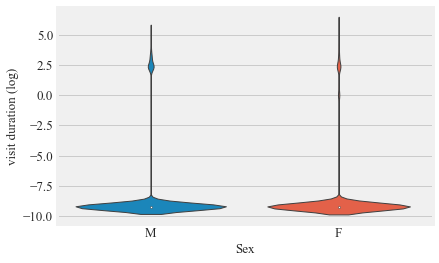

In [38]:
v = pd.merge(visit_data, meta, left_on='ID', right_on='Tag Hex', how='left')
sns.violinplot(v.Sex,np.log((v.visit_duration / np.timedelta64(1, 's')).astype(int)+0.0001))
plt.ylabel('visit duration (log)')
plt.show()

In [39]:
data.visit_duration.describe()

count                     86533
mean     0 days 00:00:00.893127
std      0 days 00:00:05.574553
min             0 days 00:00:00
25%             0 days 00:00:00
50%             0 days 00:00:00
75%             0 days 00:00:00
max             0 days 00:05:45
Name: visit_duration, dtype: object

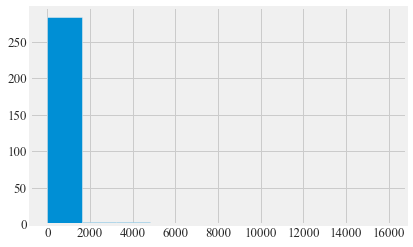

In [40]:
plt.hist(Bird_summary.duration_total)
plt.show()

In [41]:
Bird_summary.duration_total.describe()

count      293.000000
mean       263.771331
std       1165.533839
min          0.000000
25%          0.000000
50%          1.000000
75%        109.000000
max      16024.000000
Name: duration_total, dtype: float64

# Short visits

In [42]:
v_s = v[v.visit_duration =='0 seconds']
v_s.shape

(86196, 15)

In [43]:
v_s.visit_duration.sum()

Timedelta('0 days 00:00:00')

## Long visits

In [44]:
v_d = v[v.visit_duration>'0 seconds']
v_d.shape

(4859, 15)

## Total time observed

In [45]:
v_d.visit_duration.sum()

Timedelta('0 days 21:57:57')

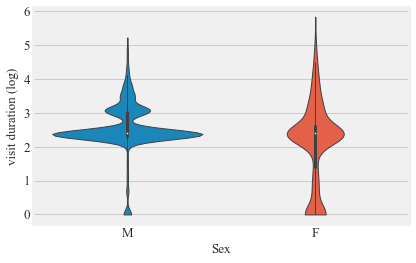

In [46]:
sns.violinplot(v_d.Sex,np.log((v_d.visit_duration / np.timedelta64(1, 's')).astype(int)+0.0001), cut=0)
plt.ylabel('visit duration (log)')
plt.show()

## difference in the visit duration males vs females

In [47]:
Bird_summary.Sex.unique()

array([u'M', u'F'], dtype=object)

In [48]:
v_d.head()

,visit_start,visit_end,ID,Tag,visit_duration,SrNo.,Tag Hex,Tag Dec,Species,Age,Sex,Tagged Date,Location,Location Id,ShortBandLetterNumber
3,2018-12-14 14:22:49,2018-12-14 14:22:50,3D6.00184967F0,B5,00:00:01,16203.0,3D6.00184967F0,982.000407,ANHU,AHY,M,2018-02-25,BH,SB,K89580
5,2018-12-16 08:29:43,2018-12-16 08:30:11,3D6.00184967F0,B5,00:00:28,16203.0,3D6.00184967F0,982.000407,ANHU,AHY,M,2018-02-25,BH,SB,K89580
7,2018-12-16 08:50:39,2018-12-16 08:50:58,3D6.00184967F0,B5,00:00:19,16203.0,3D6.00184967F0,982.000407,ANHU,AHY,M,2018-02-25,BH,SB,K89580
11,2018-12-16 13:56:37,2018-12-16 13:56:38,3D6.00184967F0,B5,00:00:01,16203.0,3D6.00184967F0,982.000407,ANHU,AHY,M,2018-02-25,BH,SB,K89580
13,2018-12-16 14:56:08,2018-12-16 14:56:25,3D6.00184967F0,B5,00:00:17,16203.0,3D6.00184967F0,982.000407,ANHU,AHY,M,2018-02-25,BH,SB,K89580


In [49]:
v_d['visit_duration_seconds'] = v_d['visit_duration'].dt.total_seconds()
trial = v_d.groupby(['ID', 'Sex']).visit_duration_seconds.mean()
trial = pd.DataFrame(trial)
trial.columns = ['duration_mean']
trial.reset_index(inplace= True)
trial.head()

C:\Users\Falco\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ID,Sex,duration_mean
0,3D6.00184967F0,M,18.714286
1,3D6.001881F73A,M,45.600000
2,3D6.001881F743,M,10.000000
3,3D6.001881F758,M,13.432432
4,3D6.001881F76C,M,19.223650


In [50]:
m_v_d1 = trial[trial.Sex== 'M']
m_v_d = m_v_d1.duration_mean #/ np.timedelta64(1, 's')
f_v_d1 = trial[trial.Sex== 'F']
f_v_d = f_v_d1.duration_mean #/ np.timedelta64(1, 's')

In [51]:
print (np.mean(f_v_d), np.std(f_v_d), len(f_v_d) )

(16.1655180247069, 21.1004302706564, 67)


In [52]:
print (np.mean(m_v_d), np.std(m_v_d), len(m_v_d) )

(18.403381385723804, 24.966809763967717, 81)


In [53]:
stats.kruskal(m_v_d, f_v_d)

KruskalResult(statistic=0.38744250051724455, pvalue=0.5336468047162171)

##### Comparison of median

In [54]:
stats.median_test(f_v_d, m_v_d)

(1.7453473373871384, 0.1864627075796551, 11.704545454545455, array([[29, 45],
        [38, 36]], dtype=int64))

In [55]:
print 'male median visit time '+ str( np.median(m_v_d))
print 'female median visit time '+ str( np.median(f_v_d))

male median visit time 13.052631578947368
female median visit time 11.0


In [56]:
print 'male mean visit time '+ str( np.mean(m_v_d))
print 'female means visit time '+ str( np.mean(f_v_d))

male mean visit time 18.4033813857
female means visit time 16.1655180247


In [57]:
print 'male std visit time '+ str( np.std(m_v_d))
print 'female std visit time '+ str( np.std(f_v_d))

male std visit time 24.966809764
female std visit time 21.1004302707


In [58]:
print 'male std visit time '+ str( m_v_d.shape)
print 'female std visit time '+ str( f_v_d.shape)

male std visit time (81L,)
female std visit time (67L,)


### Proportoin of time present

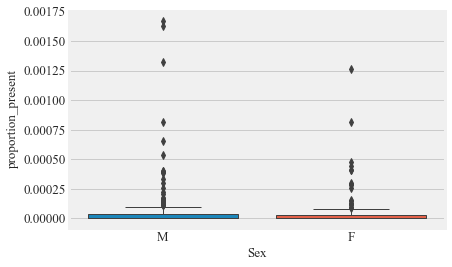

In [59]:
Bird_summary['proportion_present'] = Bird_summary.duration_total/(Bird_summary.date_u*86400)
Bird_summary['proportion_present'].describe()
sns.boxplot(Bird_summary.Sex,Bird_summary.proportion_present)
plt.show()

In [60]:
m_pt = Bird_summary[Bird_summary.Sex== 'M']
f_pt = Bird_summary[Bird_summary.Sex== 'F']
stats.mannwhitneyu(m_pt.proportion_present, f_pt.proportion_present)

MannwhitneyuResult(statistic=10396.5, pvalue=0.40449860437812674)

In [61]:
m_pt.proportion_present.describe()

count    165.000000
mean       0.000077
std        0.000233
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000040
max        0.001671
Name: proportion_present, dtype: float64

In [62]:
f_pt.proportion_present.describe()

count    128.000000
mean       0.000056
std        0.000156
min        0.000000
25%        0.000000
50%        0.000001
75%        0.000033
max        0.001262
Name: proportion_present, dtype: float64

In [63]:
Bird_summary.proportion_present.describe()

count    2.930000e+02
mean     6.801000e-05
std      2.027632e-04
min      0.000000e+00
25%      0.000000e+00
50%      2.314815e-07
75%      3.544560e-05
max      1.670525e-03
Name: proportion_present, dtype: float64

# Diel activity of Humminbirds

# Figure 7:

### Diel plots of mean hourly hummingbird visits to the feeding stations at three sites at northern and southern California from September 2016 to March 2018. The bar denotes the mean hourly visits by hummingbirds and black lines show the standard error. All distributions were statistically non-uniform (probability values reported by season).

C:\Users\Falco\Anaconda2\lib\site-packages\matplotlib\projections\polar.py:58: RuntimeWarning: invalid value encountered in less
  mask = r < 0


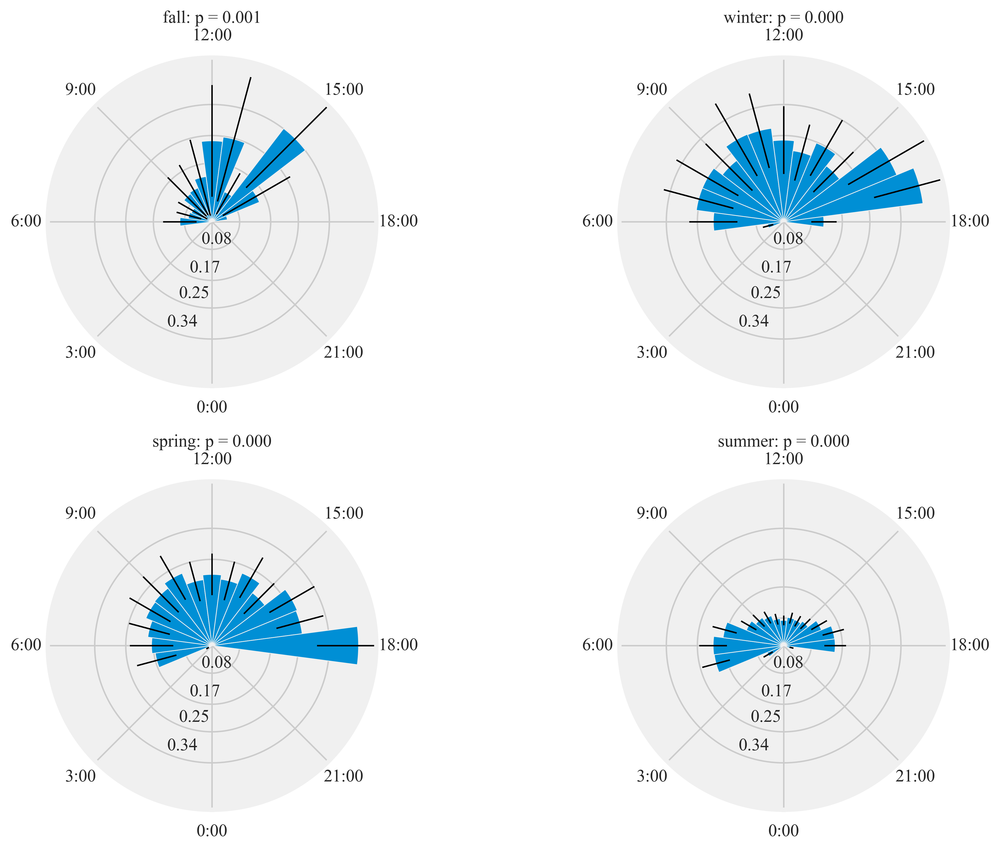

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.001
Wall time: 1min


In [64]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'all', sex = 'both', rlim = 1)

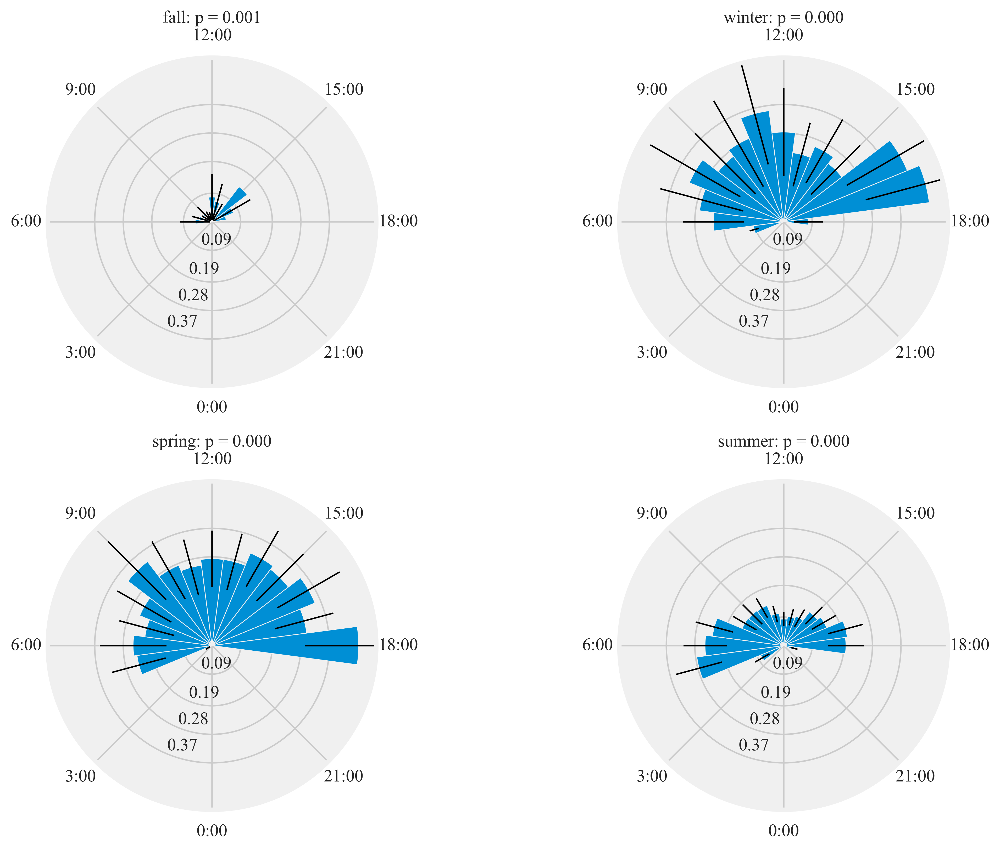

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.001
Wall time: 37.5 s


In [65]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ANHU', sex = 'both', rlim = 1)

In [66]:
data[data.Sex =='M'].visit_start.max().date()

datetime.date(2019, 1, 4)

In [67]:
data[data.Species =='ANHU'].visit_start.max().date()

datetime.date(2019, 1, 4)

In [68]:
data[data.Sex =='M'].Date.max()

datetime.date(2019, 1, 4)

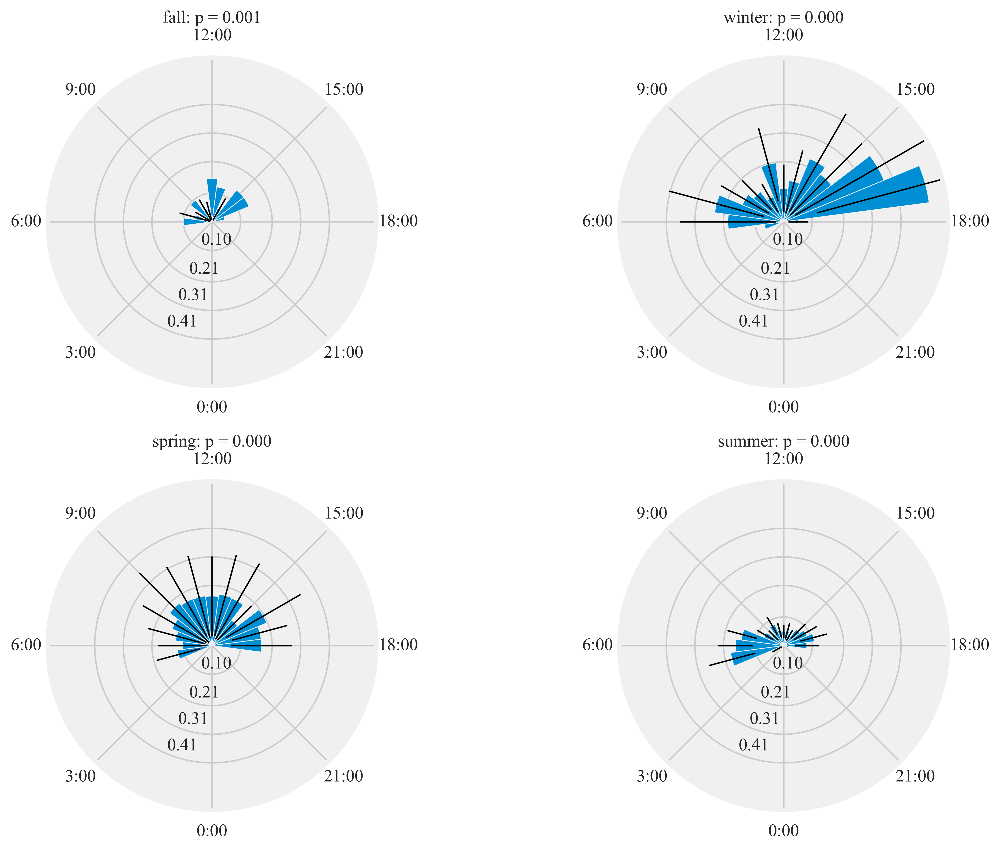

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.001
Wall time: 24.9 s


In [69]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ANHU', sex = 'F', rlim = 1)

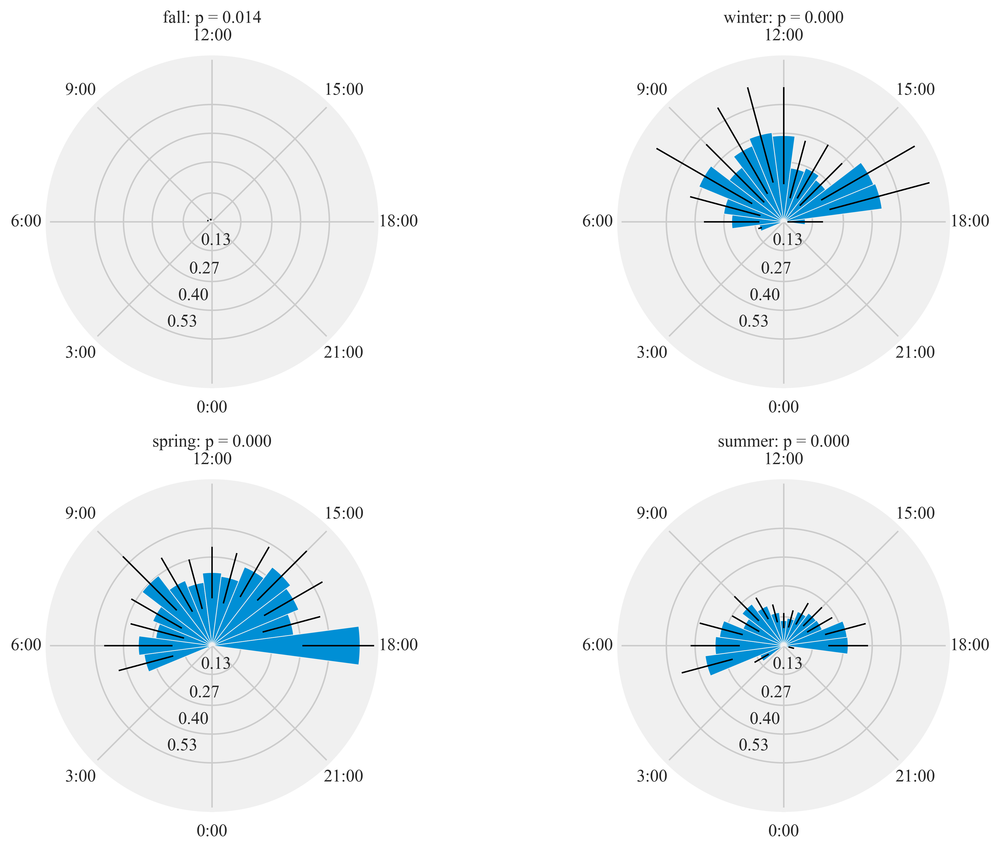

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.014
Wall time: 26 s


In [70]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ANHU', sex = 'M', rlim = 1)

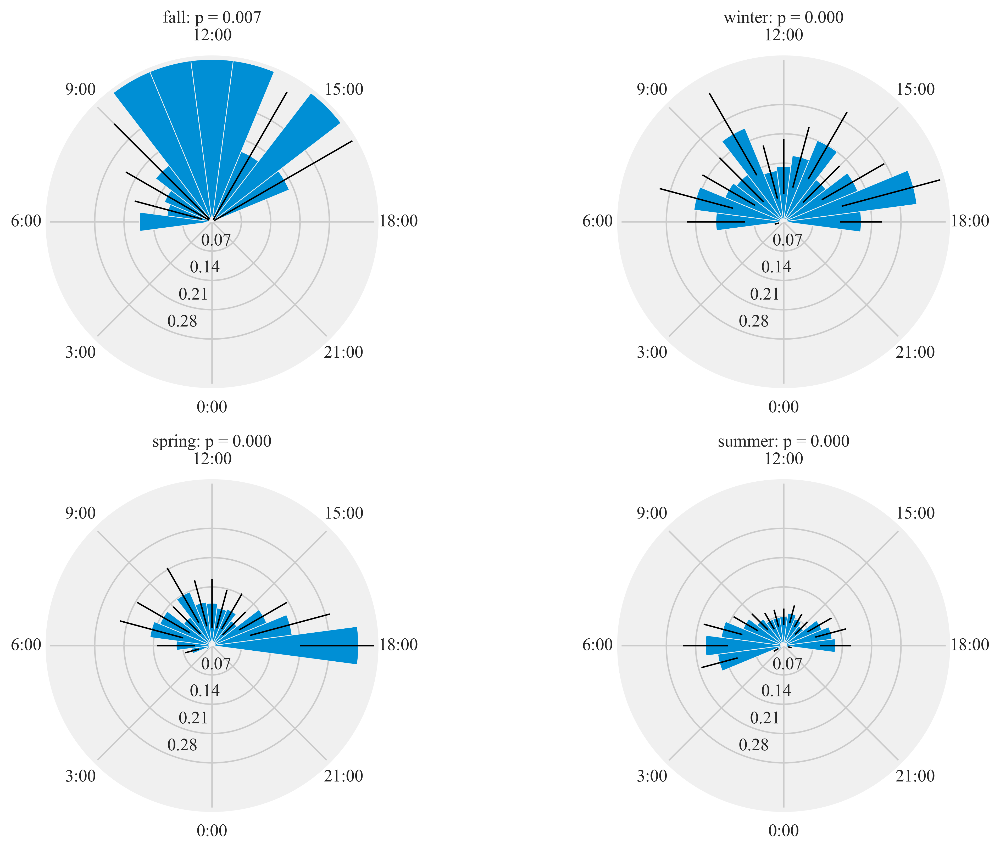

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.007
Wall time: 36.1 s


In [71]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ALHU', sex = 'both', rlim = 0.1)

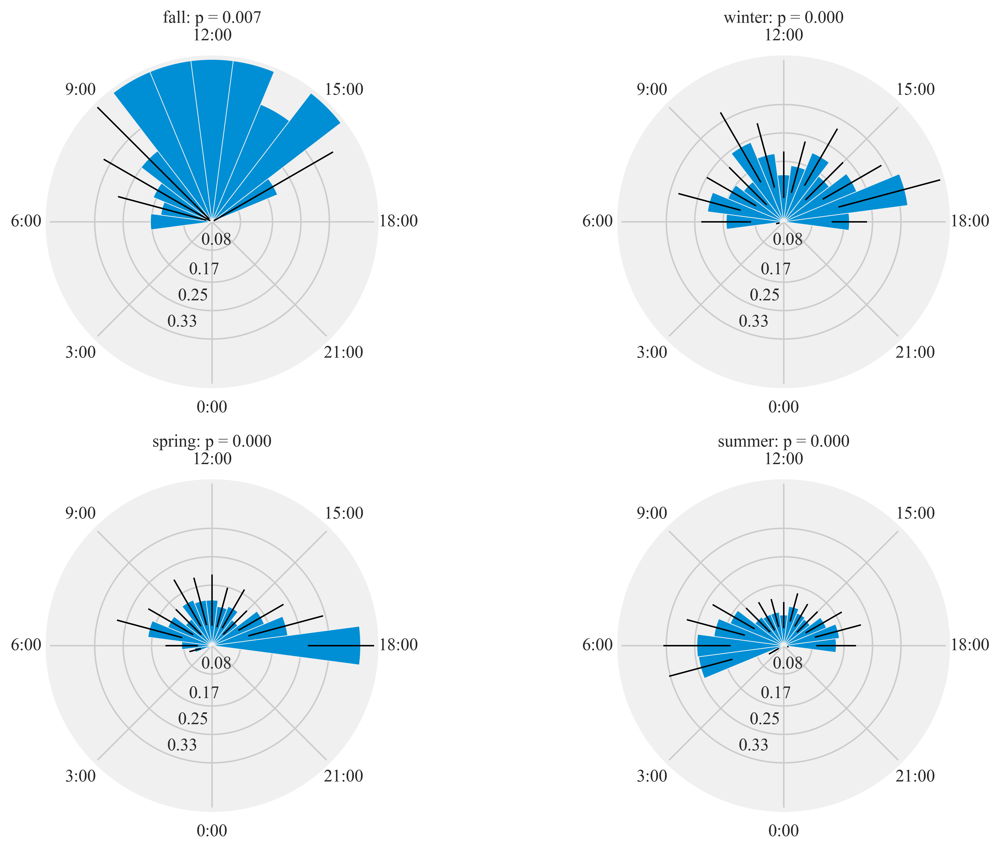

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.000
spring: p =  0.000
summer: p =  0.000
fall: p =  0.007
Wall time: 24.6 s


In [72]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ALHU', sex = 'M', rlim = 0.1)

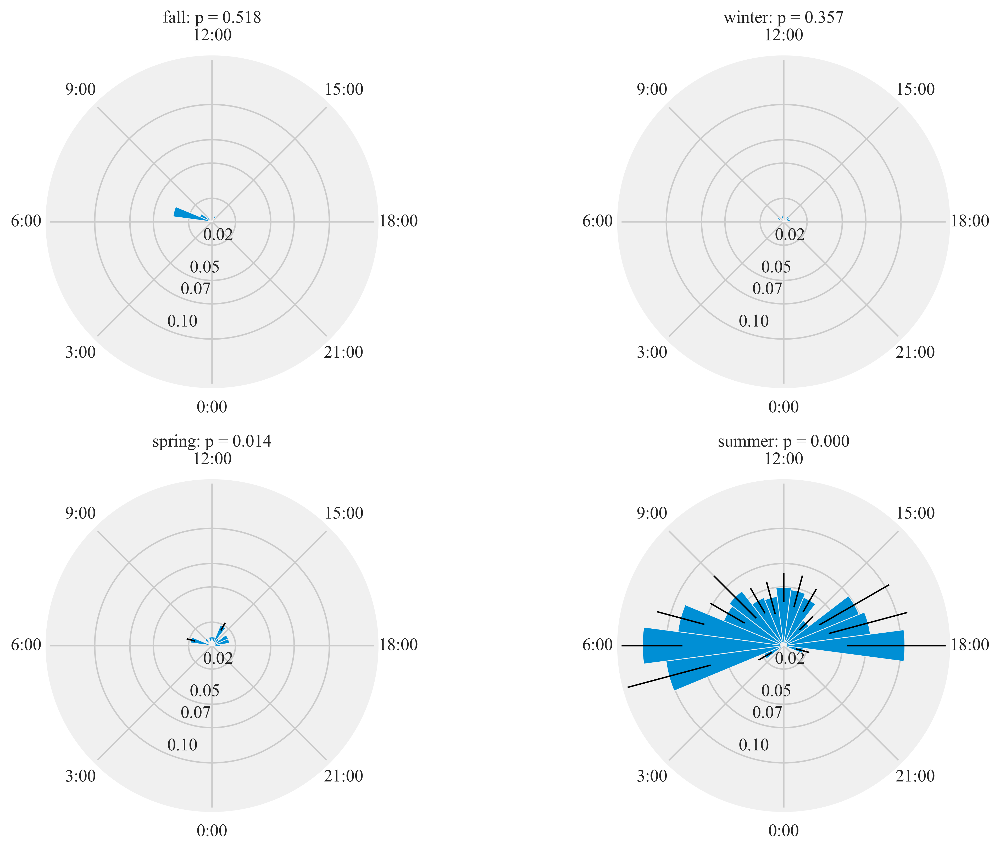

Rayleigh test identify a non-uniform distribution, i.e. it is
designed for detecting an unimodal deviation from uniformity
winter: p =  0.357
spring: p =  0.014
summer: p =  0.000
fall: p =  0.518
Wall time: 20.9 s


In [73]:
%%time
plt.rcParams['xtick.major.pad']='8'
HT.diurnal_variation(dataframe = data, output_path = output_path, species = 'ALHU', sex = 'F', rlim = 0.1)

### bird_summaries

This function:

1. calculates summaries for each tagged bird
2. save a csv file with summary output
3. columns are 

Tag Hex,Species,Sex, Age, tagged_date, first_obs_aft_tag, date_min, date_max, obser_period, date_u, Location

# Night time activity

## Birds that showed activity between 10 PM to 4 AM 

In [74]:
visit_data.set_index(pd.DatetimeIndex(visit_data['visit_start']), inplace= True)
import datetime
start = datetime.time(22,0,0)
end = datetime.time(4,0,0)
visit_data.between_time(start, end).ID.unique().tolist()

[]

### number of visits in night by birds

In [75]:
import numpy as np
n = visit_data.between_time(start, end)
n['date']= n.index.date
n.groupby(['ID', 'date']).visit_start.count()

Series([], Name: visit_start, dtype: int64)

In [76]:
n.describe()

,visit_duration
count,0
mean,NaT
std,NaT
min,NaT
25%,NaT
50%,NaT
75%,NaT
max,NaT


In [77]:
date_format='%H:%M:%S'

## Time spent at the feeder in a night

In [78]:
n.groupby(['ID', 'date']).visit_duration.sum()

Series([], Name: visit_duration, dtype: float64)

## feeders used in night

In [79]:
n.groupby(['ID', 'date'])['Tag'].unique()

Series([], Name: Tag, dtype: float64)

In [80]:
from matplotlib import dates as dates 
import datetime as datetime
from matplotlib.ticker import MaxNLocator

# Figure 8:

### Activity of an after hatch year male Anna’s hummingbird with a subcutaneously placed PIT at Site 2 between May 22nd and May 26th 2017. This bird was detected at the feeder after sunset, evident in the peaks of hourly visits during the night (green shaded sections of plot).

f, (ax1)  = plt.subplots(1, 1, figsize=(8,6))
HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967AD', 
              start = '2017-05-22', 
              end ='2017-05-26',Bird_summary_data= Bird_summary,  ax = ax1)

#f.suptitle('Hummingbird visits to feeders', fontsize = 24)
f.tight_layout()#rect=[0, 0.03, 1, 0.95]
f.savefig(output_path+'/Figure 7.png', dpi = dpi)
f.savefig(output_path+'/Figure 7.eps',format = 'eps',  dpi=dpi)
plt.show()

# Figure S1:

### Activity of PIT tagged Anna’s Hummingbirds (Calypte anna) detected between 10 PM to 4 AM for the study period (September 2016- March 2018).  This nocturnal activity was only seen at study site 2 in northern California. The shaded portion represents night time. Days preceding and succeeding the night 

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6), (ax7,ax8,ax9))  = plt.subplots(nrows = 3, ncols = 3, figsize = (11,11))

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967A4', 
              start = '2018-01-04', 
              end ='2018-01-07',Bird_summary_data= Bird_summary,  ax = ax1, title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967A7', 
              start = '2017-06-18', 
              end ='2017-06-20',Bird_summary_data= Bird_summary,  ax = ax2,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967AD', 
              start = '2017-05-22', 
              end ='2017-05-26',Bird_summary_data= Bird_summary,  ax = ax3,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967AF', 
              start = '2017-05-22', 
              end ='2017-05-26',Bird_summary_data= Bird_summary,  ax = ax4,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967AF', 
              start = '2018-01-05', 
              end ='2018-01-07',Bird_summary_data= Bird_summary,  ax = ax5,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967BC', 
              start = '2017-06-18', 
              end ='2017-06-20',Bird_summary_data= Bird_summary,  ax = ax6,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967BF', 
              start = '2018-01-04', 
              end ='2018-01-06',Bird_summary_data= Bird_summary,  ax = ax7,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.00184967BF', 
              start = '2018-02-09', 
              end ='2018-02-11',Bird_summary_data= Bird_summary,  ax = ax8,title = True)

HT.plotBirdnight(data = visit_data, bird_ID='3D6.1D593D7848', 
              start = '2018-02-12', 
              end ='2018-02-14',Bird_summary_data= Bird_summary,  ax = ax9,title = True)


plt.tight_layout()
plt.savefig(output_path+'/Figure S1.png',  dpi=250)
plt.savefig(output_path+'/Figure S1.eps',format = 'eps',  dpi=250)
plt.savefig(output_path+'/Figure S1.jpg',  dpi=250)
plt.show()

# Feeder preference

# Figure 9:

### The preference of individual Anna’s and Allen’s Hummingbirds for the primary, secondary, and tertiary feeders in Site 2 in Northern California. Solid circles show the data points.

In [81]:
reader_predilection.columns =reader_predilection.columns.get_level_values(0)
reader_predilection.head()

Tag,A9,B1,B2,B5,B6
ID,,,,,
3D6.00184967F0,0,0,7,29,73
3D6.001881F730,0,0,3,0,0
3D6.001881F733,3,2,3,0,0
3D6.001881F736,1,0,6,0,0
3D6.001881F73A,0,0,14,0,0


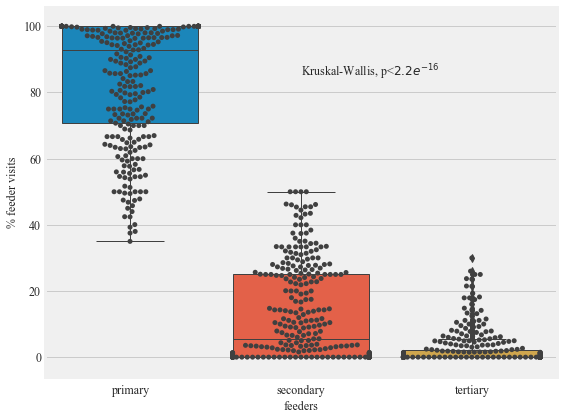

In [82]:
reader_predilection.columns =reader_predilection.columns.get_level_values(0)
#t = reader_predilection.drop('A1', axis=1)
t = reader_predilection
#t.set_index('ID',inplace= True)
primary = []
secondary = []
tertiary = []
bird = []
for index,row in t.iterrows():
    if row.values.max() !=0:
        r = sorted(row.values, reverse= True)
        total  = float(row.values.sum())
        bird.append(index)
        primary.append(r[0]/total)
        secondary.append(r[1]/total)
        tertiary.append(r[2]/total)

r_p = pd.DataFrame({'primary':primary,'secondary':secondary,'tertiary':tertiary}, index=bird)
r_p = r_p*100
###################################################################################################
###################################################################################################
#r_p.head()
t = t[(t.T != 0).any()]
t.idxmax(axis=1).value_counts()
###################################################################################################
###################################################################################################
primary = []
secondary = []
tertiary = []
bird = []
for index,row in t.iterrows():
    if row.values.max() !=0:
        r = sorted(row.values, reverse= True)
        total  = float(row.values.sum())
        bird.append(index)
        primary.append(r[0]/total)
        secondary.append(r[1]/total)
        tertiary.append(r[2]/total)
        
###################################################################################################
###################################################################################################

import seaborn as sns
f, (ax1)  = plt.subplots(1, 1, figsize=(8,6))
sns.boxplot(x="variable", y="value", data=r_p.melt(), ax = ax1)
ax = sns.swarmplot(x="variable", y="value", data=r_p.melt(), color=".25", ax = ax1)
ax1.set_xlabel('feeders')
ax1.set_ylabel('% feeder visits')
ax1.text(1, 85, r'Kruskal-Wallis, p<$2.2e^{-16}$')
f.tight_layout()#rect=[0, 0.03, 1, 0.95]
f.savefig(output_path+'/Figure 8.png', dpi = dpi)
f.savefig(output_path+'/Figure 8.eps',format = 'eps',  dpi=dpi)
plt.show()

In [83]:
r_p.describe()

,primary,secondary,tertiary
count,293.000000,293.000000,293.000000
mean,84.083131,12.715866,2.591490
std,18.104392,14.415840,5.343630
min,35.000000,0.000000,0.000000
25%,70.731707,0.000000,0.000000
50%,92.920354,5.555556,0.000000
75%,100.000000,25.000000,2.264151
max,100.000000,50.000000,30.000000


## Interactions contact network

In [84]:
interactions = Hxnet.get_intreactions(data=data)
interactions.shape

(5319, 26)

In [85]:
print ('there were '+ str(interactions.shape[0])+' interactions observed during the study period')

there were 5319 interactions observed during the study period


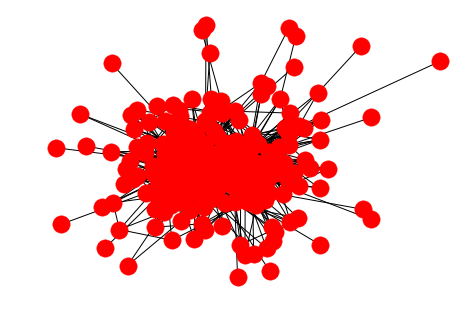

In [86]:
Hnet = Hxnet.get_interaction_networks(network_name='hummingbirds', data = data, 
                                      interactions = interactions, 
                                      location = output_path)   

In [87]:
import networkx as nx
nx.write_graphml(Hnet, output_path +'/'+ "hummingbirds_interaction.graphml")

In [88]:
from taggit import interactions as Hxnet

In [89]:
a = data.groupby(['ID', 'Sex', 'Age', 'Location', 'Species']).size().reset_index().rename(columns={0:'count'})

In [124]:
random = np.random.seed(0)
from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(
                          # Behavior alternatives
                          outboundAttractionDistribution=False,  # Dissuade hubs
                          linLogMode=False,  # NOT IMPLEMENTED
                          adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                          edgeWeightInfluence=0.4,

                          # Performance
                          jitterTolerance=1.0,  # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=1.2,
                          multiThreaded=False,  # NOT IMPLEMENTED

                          # Tuning
                          scalingRatio=5.0,
                          strongGravityMode=False,
                          gravity=1.0,

                          # Log
                          verbose=True,
                            )#**random

# Figure 10: (Manuscript has a figure generated using Gephi)

### Contact network of tagged Anna’s (pink nodes) and Allen’s hummingbirds (green nodes). The sex of the hummingbirds indicated by M for males and F for females. The size of the node is proportional to the degree of the interaction. Edges represent time spent together at the feeding station and the width of the edge width is proportional to the time spent together.

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.54it/s]


('BarnesHut Approximation', ' took ', '6.28', ' seconds')
('Repulsion forces', ' took ', '33.39', ' seconds')
('Gravitational forces', ' took ', '0.21', ' seconds')
('Attraction forces', ' took ', '3.76', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.02', ' seconds')


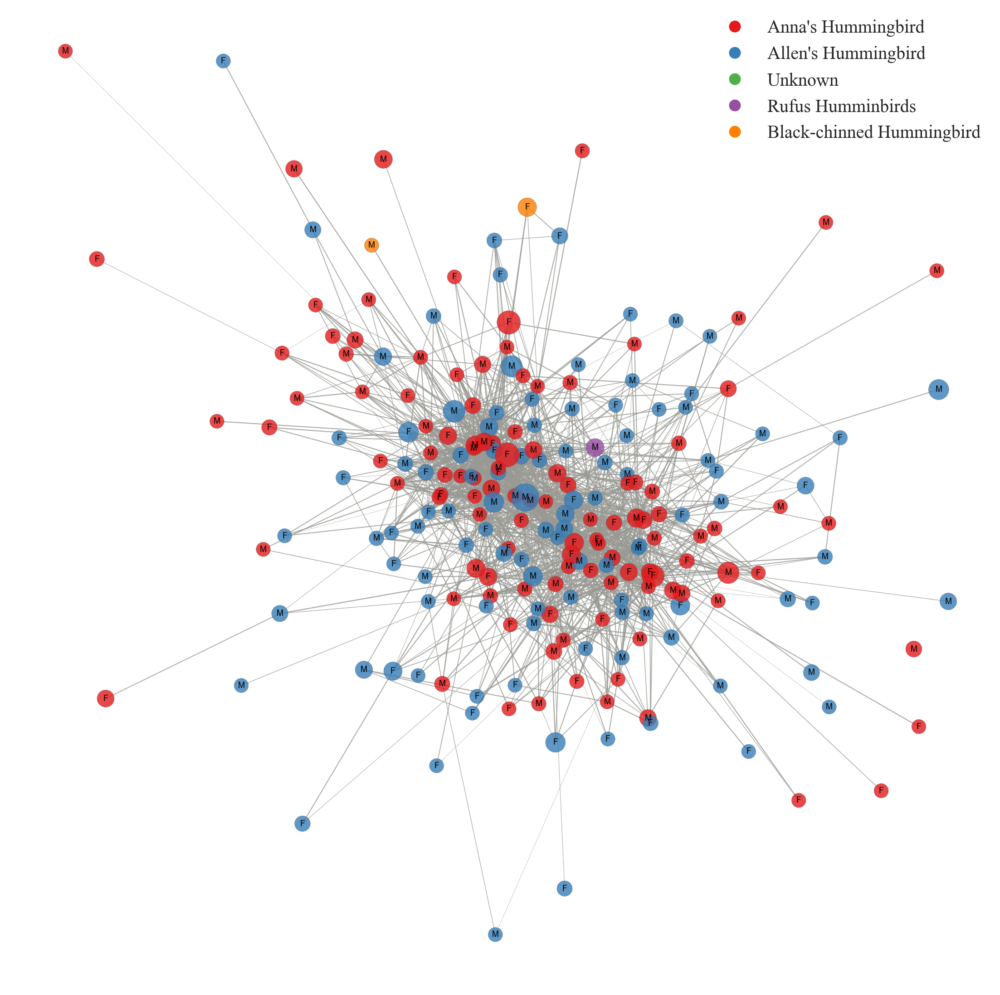

Wall time: 1min 49s


In [126]:
%%time
np.random.seed(1234)
color_map = {"ANHU":'#e41a1c', "ALHU":'#377eb8', '-':'#4daf4a' , 'RUHU':'#984ea3', 'BCHU':'#ff7f00'} 

plt.figure(figsize=(30,30))
options = {
    'edge_color': '#999994',
    'font_weight': 'regular',
    'label': True,
    'alpha': 0.8
}
colors = [color_map[Hnet.node[node]['Species']] for node in Hnet]
#sizes = [G.node[node]['nodesize']*10 for node in G]
w = nx.get_edge_attributes(Hnet,'weight').values()
w2 = [np.log(x -1) for x in w]
s = [1000+(10000*np.log2(x+1))+(np.log2(np.log2(x+1)+1)*10000) for x in nx.betweenness_centrality(Hnet,).values()]
l = nx.get_node_attributes(Hnet, 'Sex').values()
mapping=nx.get_node_attributes(Hnet, 'Sex')
#Hnet=nx.relabel_nodes(Hnet,mapping)
"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""

positions = forceatlas2.forceatlas2_networkx_layout(Hnet, pos=None, iterations=10000)
#positions  = nx.fruchterman_reingold_layout(Hnet)

nx.draw(Hnet, node_color=colors, node_size=s, pos=positions, width = w2,  **options)
nx.draw_networkx_labels(Hnet,positions,mapping,font_size=18)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00']
texts = ["Anna's Hummingbird", "Allen's Hummingbird", 'Unknown', 'Rufus Humminbirds', 'Black-chinned Hummingbird']
patches = [plt.plot([],[], marker="o", ms=25, ls="", mec=None, color=colors[i], 
            label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]
ax.legend(handles=patches, loc='best', ncol=1, 
          facecolor="plum", numpoints=1, fontsize=40 )#bbox_to_anchor=(0.5, 0.5)

plt.savefig(output_path+'/Network_diagram.png', dpi = dpi)
plt.savefig(output_path+'/Network_diagram.eps', format = 'eps', dpi = dpi)
plt.show()

(array([492., 372., 389., 431., 260.,   1.,   0.,   0.,   2.,   1.]),
 array([ 1. ,  3.1,  5.2,  7.3,  9.4, 11.5, 13.6, 15.7, 17.8, 19.9, 22. ]),
 <a list of 10 Patch objects>)

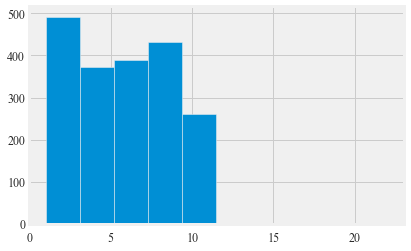

In [122]:
plt.hist(w2)

## Analysis for comparing degree distrbutions

# Figure S2:

### Results of permutation-based regression analysis to understand the effect of age and sex on the degree of in the observed network. Blue lines show the distribution of coefficients after 10,000 permutations. Red lines show original coefficients.

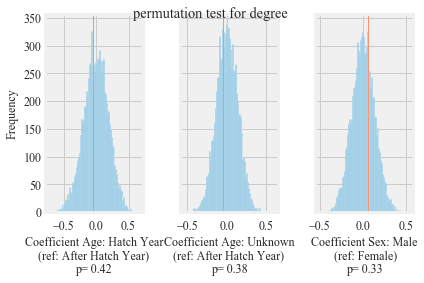

Wall time: 3min 5s


In [92]:
%%time
Hxnet.run_permutation_test(dependent='degree', network= Hnet, number_of_permutations = 10000, output_path = output_path)

# Figure S3:

### Results of permutation-based regression analysis to understand the effect of age and sex on the betweenness centrality of in the observed network. Blue lines show the distribution of coefficients after 10,000 permutations. Red lines show original coefficients.

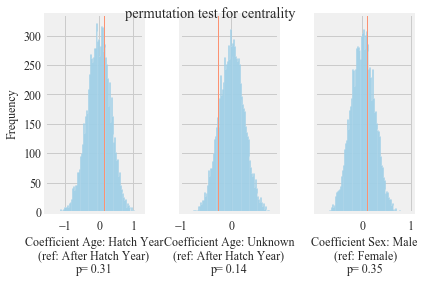

Wall time: 2min 31s


In [93]:
%%time
Hxnet.run_permutation_test(dependent='centrality', network= Hnet, number_of_permutations = 10000, output_path = output_path)

In [94]:
males = zip(*filter(lambda (n, d): d['Sex'] == 'M', Hnet.nodes(data=True)))[0]
females = zip(*filter(lambda (n, d): d['Sex'] == 'F', Hnet.nodes(data=True)))[0]
HY = zip(*filter(lambda (n, d): d['Age'] == 'HY', Hnet.nodes(data=True)))[0]
AHY = zip(*filter(lambda (n, d): d['Age'] == 'AHY', Hnet.nodes(data=True)))[0]

#####################################################################################
#####################################################################################

m_d = sorted(zip(*Hnet.degree(males))[1], reverse=True)
f_d = sorted(zip(*Hnet.degree(females))[1], reverse=True)
hy_d = sorted(zip(*Hnet.degree(HY))[1], reverse=True)
ahy_d = sorted(zip(*Hnet.degree(AHY))[1], reverse=True)

#####################################################################################
#####################################################################################

bc = nx.betweenness_centrality(Hnet)
males_bc = { m: bc[m] for m in males }
females_bc = { m: bc[m] for m in females }
AHY_bc = { m: bc[m] for m in AHY }
HY_bc = { m: bc[m] for m in HY }

In [95]:
degree = sorted(zip(*Hnet.degree(males))[1], reverse=True)

max(degree)

78

In [96]:
min(degree)

1

#### degree distbutions between males and females statistical comparison

In [97]:
stats.ks_2samp(m_d, f_d)

Ks_2sampResult(statistic=0.10989972942861692, pvalue=0.48665954273301154)

#### degree distbutions between hatch year and after hatch years statistical comparison

In [98]:
stats.ks_2samp(hy_d, ahy_d)

Ks_2sampResult(statistic=0.09576968272620451, pvalue=0.9603172076279858)

#### betweenness centrality males and females years statistical comparison

In [99]:
stats.ks_2samp(males_bc.values(), females_bc.values())

Ks_2sampResult(statistic=0.14634728632818716, pvalue=0.1675018932407487)

#### betweenness centrality hatch year and after hatch years statistical comparison

In [100]:
stats.ks_2samp(AHY_bc.values(), HY_bc.values())

Ks_2sampResult(statistic=0.15393654524089306, pvalue=0.5239081098748823)

# Figure 10:
### Contact network of tagged Anna’s (pink nodes) and Allen’s hummingbirds (green nodes). The sex of the hummingbirds indicated by M for males and F for females. The size of the node is proportional to the degree of the interaction. Edges represent time spent together at the feeding station and the width of the edge width is proportional to the time spent together.

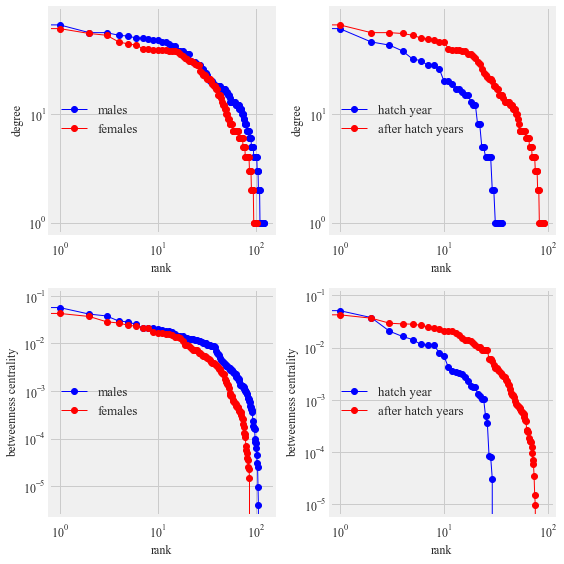

In [101]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (8,8))
ax1.loglog(m_d, 'b-', marker='o', label = 'males')
ax1.loglog(f_d, 'r-', marker='o', label = 'females')
ax1.legend()
ax1.set_ylabel("degree")
ax1.set_xlabel("rank")

ax2.loglog(hy_d, 'b-', marker='o', label = 'hatch year')
ax2.loglog(ahy_d, 'r-', marker='o', label = 'after hatch years')
ax2.legend()
ax2.set_ylabel("degree")
ax2.set_xlabel("rank")

ax3.loglog(sorted (males_bc.values(), reverse= True), 'b-', marker='o', label = 'males')
ax3.loglog(sorted (females_bc.values(), reverse= True), 'r-', marker='o', label = 'females')
ax3.legend()
ax3.set_ylabel("betweenness centrality")
ax3.set_xlabel("rank")

ax4.loglog(sorted (HY_bc.values(), reverse= True), 'b-', marker='o', label = 'hatch year')
ax4.loglog(sorted (AHY_bc.values(), reverse= True), 'r-', marker='o', label = 'after hatch years')
ax4.legend()
ax4.set_ylabel("betweenness centrality")
ax4.set_xlabel("rank")
plt.tight_layout()
plt.savefig(output_path+'/Figure 10.png', dpi= dpi)
plt.savefig(output_path+'/Figure 10.eps',format= 'eps', dpi= dpi)
plt.show()

## Table 6

In [102]:
i = list(pd.unique(interactions[['ID', 'second_bird']].values.ravel('K')))
interacted_birds = meta[meta['Tag Hex'].isin(i)]
inter = pd.pivot_table(data=interacted_birds, index='Species', columns=['Sex', 'Age'] , aggfunc= 'count', values='Tag Hex', fill_value=0, margins= True)
inter

Sex       F          M          All
Age     AHY HY UNK AHY  HY UNK     
Species                            
ALHU     19  0  32  18  17  20  106
ANHU     23  3  25  30  16  19  116
BCHU      1  0   0   0   1   0    2
RUHU      0  0   0   1   0   0    1
All      43  3  57  49  34  39  225

In [103]:
pd.pivot_table(data=interacted_birds, index='Species', columns='Sex' , aggfunc= 'count', values='Tag Hex', fill_value=0, margins= True)

Sex,F,M,All
Species,,,
ALHU,51,55,106
ANHU,51,65,116
BCHU,1,1,2
RUHU,0,1,1
All,103,122,225


### Types of interactions

In [104]:
m2 = meta[['Tag Hex', 'Species', 'Age', 'Sex']]
m2.columns = ['second_bird', 'Species2', 'Age2', 'Sex2']
i2 = pd.merge(interactions, m2, on='second_bird', how='left')
def returnTypeInt (c):
    if [(c.Sex == 'M') & (c.Sex2 == 'M')]:
        return 'MM'
    elif [(c.Sex == 'M') & (c.Sex2 == 'F')]:
        return 'MF'
    elif [(c.Sex == 'F') & (c.Sex2 == 'M')]:
        return 'MF'
    elif [(c.Sex == 'F') & (c.Sex2 == 'F')]:
        return 'FF'
    else:
        return 'Problem'

In [105]:
conditions = [
    (i2['Sex'] == 'M') & (i2['Sex2'] == 'M'),
    (i2['Sex'] == 'M') & (i2['Sex2'] == 'F'),
    (i2['Sex'] == 'F') & (i2['Sex2'] == 'M'),
    (i2['Sex'] == 'F') & (i2['Sex2'] == 'F')
]
choices = ['MM', 'MF', 'MF', 'FF']
i2['Type'] = np.select(conditions, choices, default='MM')


conditions2 = [
    (i2['overlap'] <= 0),
    (i2['overlap'] > 0)
]#(i2['overlap'] == 0)
choices = ['short_interactions',  'long_interactions'] #'medium_interactions',
i2['DurationType'] = np.select(conditions2, choices, default='short_interaction')

#i2['Type'] = i2.apply(returnTypeInt, axis=1)
i2['Type'].value_counts()

MF    2459
MM    2113
FF     747
Name: Type, dtype: int64

In [106]:
#i2['Type'] = i2.apply(returnTypeInt, axis=1)
i2['Type'].value_counts()

MF    2459
MM    2113
FF     747
Name: Type, dtype: int64

In [107]:
i2['DurationType'].value_counts()

short_interactions    5305
long_interactions       14
Name: DurationType, dtype: int64

In [108]:
inter_pv = pd.pivot_table(columns='DurationType', index='Type',data=i2, fill_value=0, aggfunc='count', values='ID')
inter_pv

DurationType,long_interactions,short_interactions
Type,,
FF,0,747
MF,4,2455
MM,10,2103


In [109]:
i2.Age2.unique()

array([u'UNK', u'HY', u'AHY'], dtype=object)

In [110]:
conditions3 = [
    (i2['Age'] == 'HY') & (i2['Age2'] == 'HY'),
    (i2['Age'] == 'HY') & (i2['Age2'] == 'AHY'),
    (i2['Age'] == 'HY') & (i2['Age2'] == 'UNK'),
    
    (i2['Age'] == 'AHY') & (i2['Age2'] == 'HY'),
    (i2['Age'] == 'AHY') & (i2['Age2'] == 'AHY'),
    (i2['Age'] == 'AHY') & (i2['Age2'] == 'UNK'),
    
    (i2['Age'] == 'UNK') & (i2['Age2'] == 'HY'),
    (i2['Age'] == 'UNK') & (i2['Age2'] == 'AHY'),
    (i2['Age'] == 'UNK') & (i2['Age2'] == 'UNK'),
    ]
choices = ['HyHy', 'HyAHy', 'HyUNK', 'HyAHy', 'AHyAHy', 'AHyUNK', 'HyUNK', 'AHyUNK', 'UNKUNK']
i2['TypeAge'] = np.select(conditions3, choices, default='UNKUNK')

In [111]:
i2['TypeAge'].value_counts()

AHyUNK    1947
AHyAHy    1415
UNKUNK     787
HyAHy      552
HyUNK      533
HyHy        85
Name: TypeAge, dtype: int64

In [112]:
age_pv = pd.pivot_table(columns='DurationType', index='TypeAge',data=i2, fill_value=0, aggfunc='count', values='ID')
age_pv

DurationType,long_interactions,short_interactions
TypeAge,,
AHyAHy,4,1411
AHyUNK,9,1938
HyAHy,1,551
HyHy,0,85
HyUNK,0,533
UNKUNK,0,787


In [113]:
i2.set_index(pd.DatetimeIndex(i2['visit_start']), inplace= True)

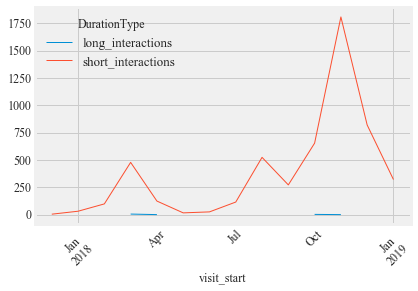

In [114]:
i2.groupby([ pd.Grouper(freq='M'), 'DurationType'])['ID'].count().unstack('DurationType').plot(kind="line", rot =45, stacked=False)
plt.show()

In [115]:
i2.groupby([ pd.Grouper(freq='M'), 'DurationType'])['ID'].count().unstack('DurationType')

DurationType,long_interactions,short_interactions
visit_start,,
2017-12-31,NaN,5.0
2018-01-31,NaN,32.0
2018-02-28,NaN,99.0
2018-03-31,6.0,479.0
2018-04-30,1.0,125.0
2018-05-31,NaN,17.0
2018-06-30,NaN,26.0
2018-07-31,NaN,116.0
2018-08-31,2.0,525.0


In [116]:
i2['visit_start'] = pd.to_datetime(i2['visit_start'])
i2.set_index(pd.DatetimeIndex(i2['visit_start']), inplace= True)
multi_index = pd.MultiIndex.from_product([pd.date_range('2016-9-22', i2.visit_start.max().date(),freq='1H'), i2['DurationType'].unique()], names=['Date', 'DurationType'])
a = i2.groupby([ pd.Grouper(freq='1H'), 'DurationType'])['ID'].count().reindex(multi_index, fill_value=0).unstack('DurationType').reset_index()#.plot(kind="bar", rot =0, stacked=True).res
a['h'] = pd.to_datetime(a['Date'], format= '%H:%M:%S' ).dt.time
agg_funcs = {'long_interactions':[np.mean, 'sem'], 'short_interactions':[np.mean, 'sem']}
a = a.groupby(a.h).agg(agg_funcs).reset_index()
a.columns = a.columns.droplevel(0)
a.columns = ['hour', 'mean_long', 'sem_long', 'mean_short', 'sem_short',]
#a['hour'] = pd.to_datetime(a['hour'])
a = a.set_index(a['hour'])
a

,hour,mean_long,sem_long,mean_short,sem_short
hour,,,,,
00:00:00,00:00:00,0.000000,0.000000,0.000000,0.000000
01:00:00,01:00:00,0.000000,0.000000,0.000000,0.000000
02:00:00,02:00:00,0.000000,0.000000,0.000000,0.000000
03:00:00,03:00:00,0.000000,0.000000,0.000000,0.000000
04:00:00,04:00:00,0.000000,0.000000,0.014388,0.006329
05:00:00,05:00:00,0.001199,0.001199,0.202638,0.036008
06:00:00,06:00:00,0.002398,0.001695,0.394484,0.055595
07:00:00,07:00:00,0.000000,0.000000,0.529976,0.073153
08:00:00,08:00:00,0.000000,0.000000,0.471223,0.069128


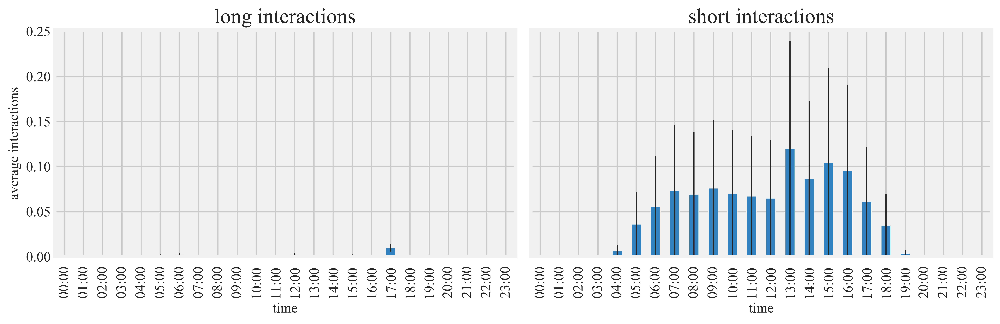

In [117]:
plt.rcParams['font.family'] = 'Times New Roman'
f, (ax1, ax2)  = plt.subplots(1, 2, figsize=(12,4), dpi=dpi, sharey=True, )
a.plot(y='mean_long', kind = 'bar', yerr='sem_long', color='#3182bd',ax= ax1, legend=False)
a.plot(y='sem_short', kind = 'bar', yerr='sem_short', color='#3182bd',ax= ax2, legend=False)
yaxis_text = 'average interactions'
ax1.set_ylabel(yaxis_text)
ax2.set_ylabel(yaxis_text)

ax1.set_title('long interactions')
ax2.set_title('short interactions')

ticks = [ x.strftime('%H:%M') for x in a.index.values ]
ax1.set_xticklabels(ticks)
ax2.set_xticklabels(ticks)

ax1.set_xlabel('time')
ax2.set_xlabel('time')
plt.tight_layout()
#plt.savefig(output_path+'/Interactions_daily_variation.png', dpi=600, figsize = (6,4))
plt.show()